In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt
import os
import re
import cv2
from PIL import Image
import torch
import torchvision
from torchvision import transforms
from torch import nn
from torch.nn import functional as F
from torch import optim
import mlflow
import json
import hydra
from omegaconf import DictConfig, OmegaConf
import albumentations as A
import time
import datetime

from utils import *
from implementations import *

In [2]:
current_dir = os.getcwd()
data_dir = os.path.join(current_dir, "../data_NuVAT/pancreas")
data = ["Case001-1", "Case001-2", "Case002-1", "Case003-2", "Case004-1", "Case006-1", 
              "Case007-1", "Case008-1", "Case008-2", "Case009-2", "Case010-2"
]

instruments_dir = "../data_NuVAT/pancreas/instruments"
instruments_dir = os.path.join(current_dir, instruments_dir)
instruments_transform = instruments_transform1
instruments_data = make_instruments_data(instruments_dir)

In [3]:
SegClasses = json.load(open("./SegClasses.json", "r"))
used_organ = ["pancreas"]

In [4]:
used_data = make_used_data(data_dir, data)
dataset = CustomDataset(data_dir, used_data, SegClasses, used_organ, common_transform=None, inference=False)

In [5]:
img, mask, _ = dataset[0]

In [6]:
shape = img.shape

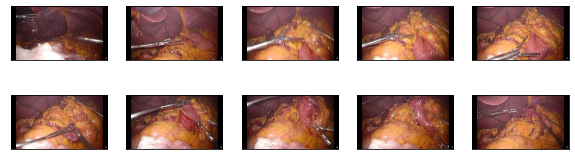

In [12]:
fig = plt.figure(figsize=(10, 3))
for i in range(10):
    img, mask, _ = dataset[i]
    
    ax = fig.add_subplot(2, 5, i+1)
    ax.imshow(img)
    ax.set_xticks([])
    ax.set_yticks([])

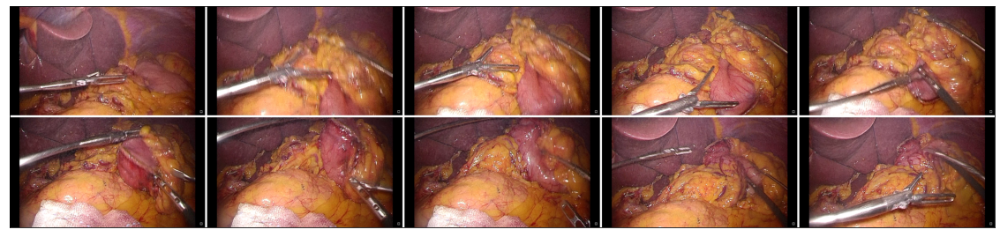

In [13]:
n_rows = 2
n_cols = 5
ex = 20
h = shape[0]
w = shape[1]
fig_h = (h + ex) * n_rows - ex
fig_w = (w + ex) * n_cols - ex
fig_c = shape[2]
figure = np.zeros((fig_h, fig_w, fig_c)).astype(np.uint8)

for i in range(n_rows):
    for j in range(n_cols):
        img, mask, _ = dataset[i*n_cols+j+1]
        figure[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = img
        figure[(h+ex)*i+h: (h+ex)*i+h+ex, :] = (255, 255, 255)
        figure[:, (w+ex)*j+w: (w+ex)*j+w+ex] = (255, 255, 255)

plt.figure(figsize=(20, 20))
plt.imshow(figure)
plt.xticks([])
plt.yticks([])
plt.show()

# Produce Random Frame

## No1 

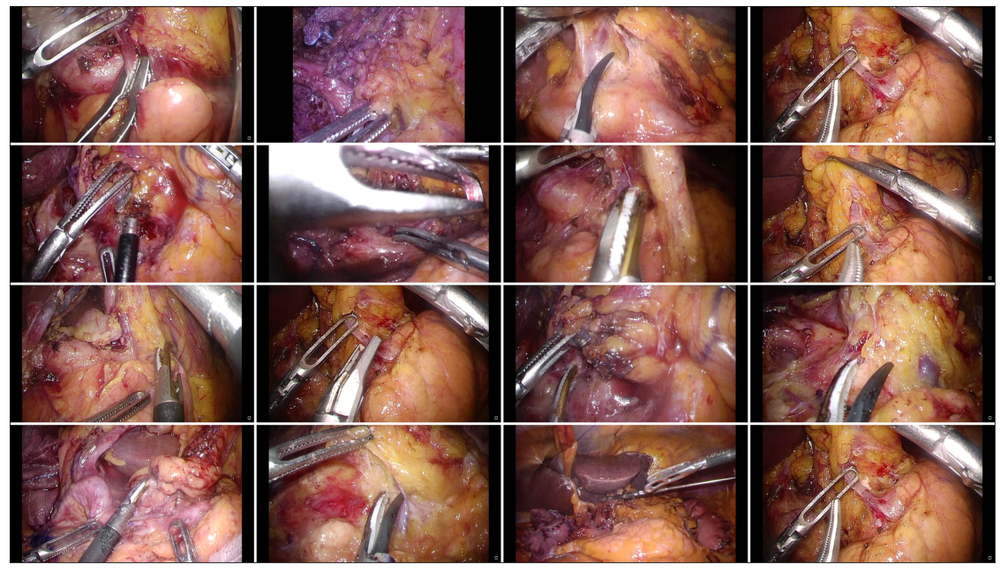

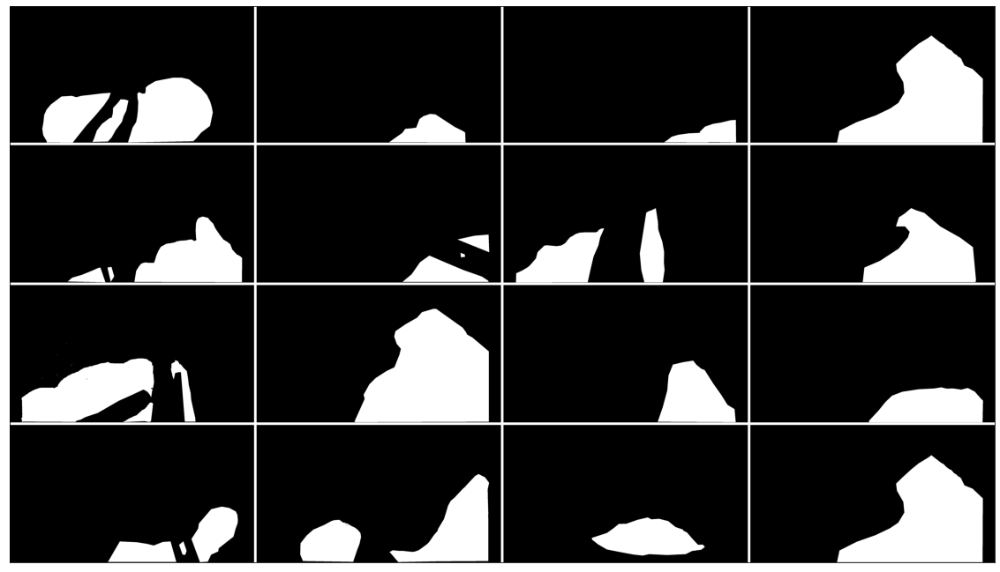

In [192]:
n_rows = 4
n_cols = 4
random_ints = np.random.randint(len(dataset), size=(n_rows * n_cols))
ex = 20
h = shape[0]
w = shape[1]
fig_h = (h + ex) * n_rows - ex
fig_w = (w + ex) * n_cols - ex
fig_c = shape[2]

figure = np.zeros((fig_h, fig_w, fig_c)).astype(np.uint8)
for i in range(n_rows):
    for j in range(n_cols):
        r_int = random_ints[i*n_cols+j]
        img, mask, _ = dataset[r_int]
        figure[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = img
        figure[(h+ex)*i+h: (h+ex)*i+h+ex, :] = (255, 255, 255)
        figure[:, (w+ex)*j+w: (w+ex)*j+w+ex] = (255, 255, 255)
plt.figure(figsize=(20, 20))
plt.imshow(figure)
plt.xticks([])
plt.yticks([])
# plt.savefig("frames.png")
plt.show()

figure2 = np.zeros((fig_h, fig_w)).astype(np.uint8)
for i in range(n_rows):
    for j in range(n_cols):
        r_int = random_ints[i*n_cols+j]
        img, mask, _ = dataset[r_int]
        figure2[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = mask
        figure2[(h+ex)*i+h: (h+ex)*i+h+ex, :] = 1
        figure2[:, (w+ex)*j+w: (w+ex)*j+w+ex] = 1
plt.figure(figsize=(20, 20))
plt.imshow(figure2, cmap="gray")
plt.xticks([])
plt.yticks([])
# plt.savefig("masks.png")
plt.show()

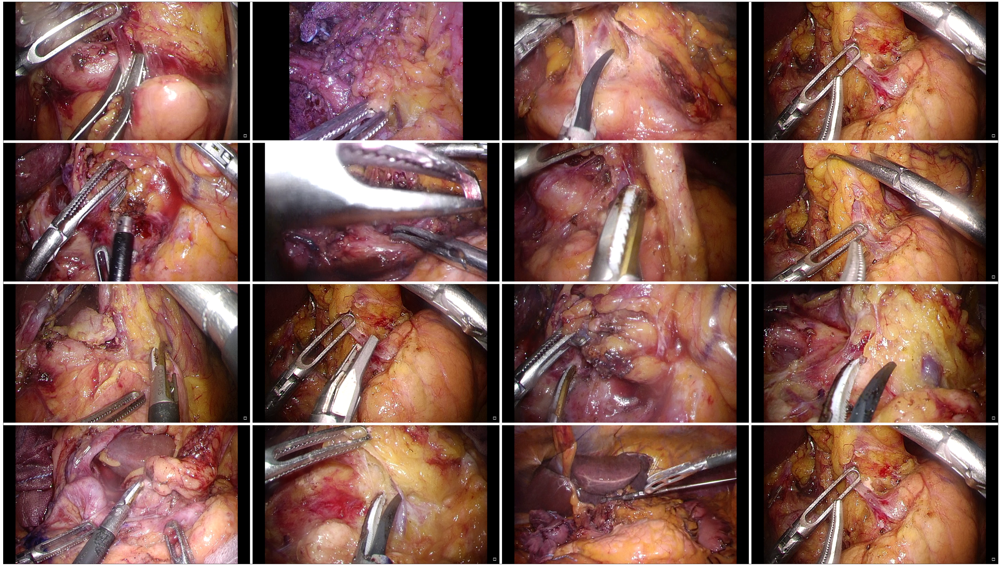

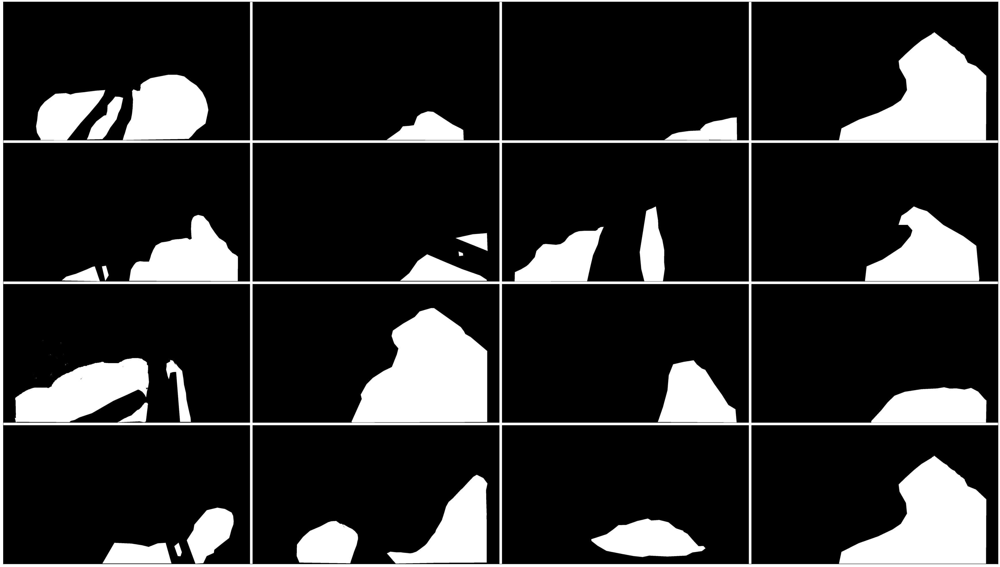

In [194]:
plt.figure(figsize=(16 * n_cols, 9 * n_rows))
plt.imshow(figure)
plt.xticks([])
plt.yticks([])
# plt.savefig("frames.png")
plt.show()

plt.figure(figsize=(16 * n_cols, 9 * n_rows))
plt.imshow(figure2, cmap="gray")
plt.xticks([])
plt.yticks([])
# plt.savefig("masks.png")
plt.show()

## No 2

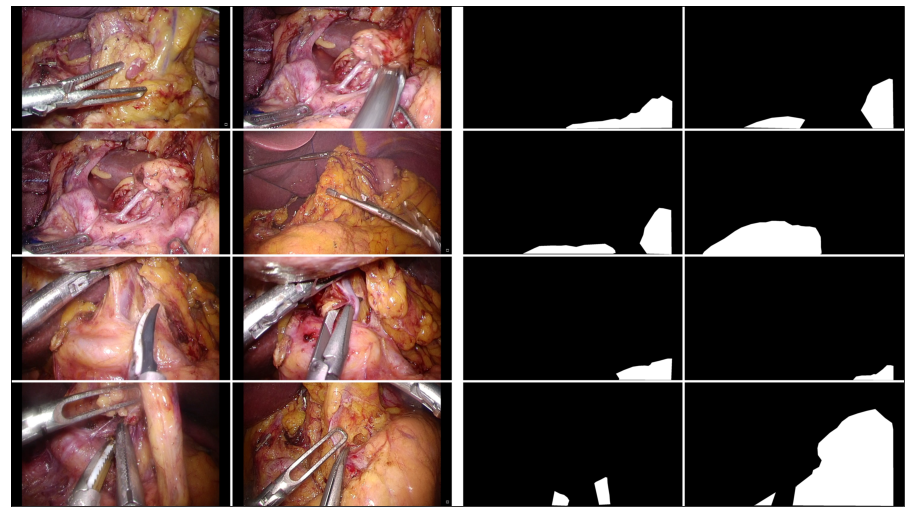

In [252]:
n_rows = 4
n_cols = 2
random_ints = np.random.randint(len(dataset), size=(n_rows * n_cols))
ex = 20
h = shape[0]
w = shape[1]
fig_h = (h + ex) * n_rows - ex
fig_w = (w + ex) * n_cols - ex
fig_c = shape[2]

figure = np.ones((fig_h, fig_w, fig_c)).astype(np.uint8) * 255
figure2 = np.zeros((fig_h, fig_w)).astype(np.uint8)
for i in range(n_rows):
    for j in range(n_cols):
        r_int = random_ints[i*n_cols+j]
        img, mask, _ = dataset[r_int]
        figure[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = img
        figure[(h+ex)*i+h: (h+ex)*i+h+ex, :] = (255, 255, 255)
        figure[:, (w+ex)*j+w: (w+ex)*j+w+ex] = (255, 255, 255)
        figure2[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = mask
        figure2[(h+ex)*i+h: (h+ex)*i+h+ex, :] = 1
        figure2[:, (w+ex)*j+w: (w+ex)*j+w+ex] = 1
        
figure_mask = np.array([figure2, figure2, figure2]).transpose(1, 2, 0) * 255

figure_ex = (np.ones((figure.shape[0], ex*5, 3)) * 255).astype(np.uint8)

figure_total = np.concatenate([figure, figure_ex, figure_mask], axis=1)
plt.figure(figsize=(4 * n_cols * 2, 3 * n_rows))
plt.imshow(figure_total)
plt.xticks([])
plt.yticks([])
# plt.savefig("frame_masks.png")
plt.show()

In [249]:
# cv2.imwrite("frame_mask.png", cv2.resize(cv2.cvtColor(figure_total, cv2.COLOR_RGB2BGR), (1920, 1080)))

# データ拡張

In [9]:
instruments_dir = "../data_NuVAT/pancreas/instruments"
instruments_dir = os.path.join(current_dir, instruments_dir)
instruments_transform = instruments_transform1
instruments_data = make_instruments_data(instruments_dir)

In [10]:
img ,mask, path = dataset[6]
print(path)

/workdir/seg-laparo/../data_NuVAT/pancreas/Case001-1/label/label_175422.png


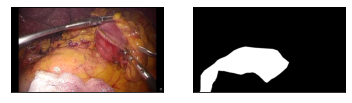

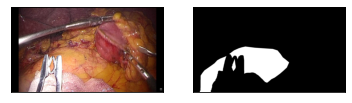

In [151]:
img_aug, mask_aug = instruments_over_img(instruments_dir, instruments_data, img, mask, transform=instruments_transform)

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(img)
ax1.set_xticks([])
ax1.set_yticks([])
ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(mask, cmap="gray")
ax2.set_xticks([])
ax2.set_yticks([])
plt.show()

fig = plt.figure()
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(img_aug)
ax1.set_xticks([])
ax1.set_yticks([])
ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(mask_aug, cmap="gray")
ax2.set_xticks([])
ax2.set_yticks([])
plt.show()

In [152]:
# cv2.imwrite("augFrame_175422.png", cv2.cvtColor(img_aug, cv2.COLOR_RGB2BGR))
# cv2.imwrite("auglabel_175422.png", cv2.cvtColor((mask_aug*255).astype(np.uint8), cv2.COLOR_RGB2BGR))

True

# Produce Random Frame with Data Augmentation

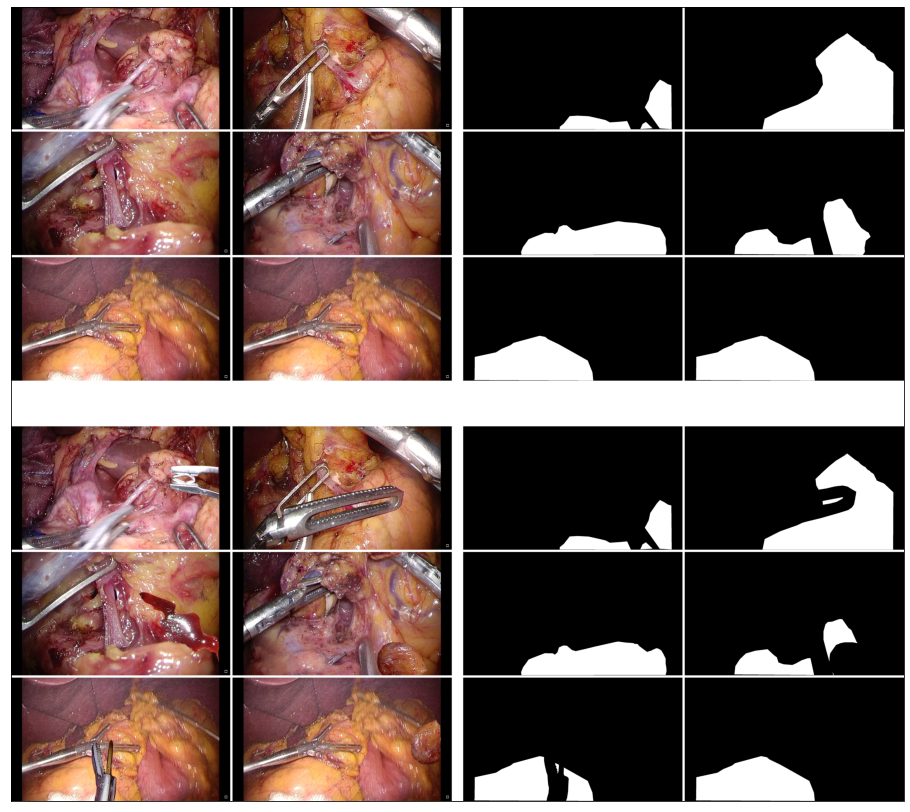

In [84]:
n_rows = 3
n_cols = 2
random_ints = np.random.randint(len(dataset), size=(n_rows * n_cols))
ex = 20
h = shape[0]
w = shape[1]
fig_h = (h + ex) * n_rows - ex
fig_w = (w + ex) * n_cols - ex
fig_c = shape[2]

figure_orig = np.ones((fig_h, fig_w, fig_c)).astype(np.uint8) * 255
figure2_orig = np.zeros((fig_h, fig_w)).astype(np.uint8)
figure = np.ones((fig_h, fig_w, fig_c)).astype(np.uint8) * 255
figure2 = np.zeros((fig_h, fig_w)).astype(np.uint8)
for i in range(n_rows):
    for j in range(n_cols):
        r_int = random_ints[i*n_cols+j]
        img, mask, _ = dataset[r_int]
        figure_orig[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = img
        figure_orig[(h+ex)*i+h: (h+ex)*i+h+ex, :] = (255, 255, 255)
        figure_orig[:, (w+ex)*j+w: (w+ex)*j+w+ex] = (255, 255, 255)
        figure2_orig[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = mask
        figure2_orig[(h+ex)*i+h: (h+ex)*i+h+ex, :] = 1
        figure2_orig[:, (w+ex)*j+w: (w+ex)*j+w+ex] = 1
        img, mask = instruments_over_img(instruments_dir, instruments_data, img, mask, transform=instruments_transform)
        figure[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = img
        figure[(h+ex)*i+h: (h+ex)*i+h+ex, :] = (255, 255, 255)
        figure[:, (w+ex)*j+w: (w+ex)*j+w+ex] = (255, 255, 255)
        figure2[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = mask
        figure2[(h+ex)*i+h: (h+ex)*i+h+ex, :] = 1
        figure2[:, (w+ex)*j+w: (w+ex)*j+w+ex] = 1

n_space1 = 5
n_space2 = 20
        
figure_mask_orig = np.array([figure2_orig, figure2_orig, figure2_orig]).transpose(1, 2, 0) * 255
figure_mask = np.array([figure2, figure2, figure2]).transpose(1, 2, 0) * 255

figure_ex_orig = (np.ones((figure_orig.shape[0], ex*n_space1, 3)) * 255).astype(np.uint8)
figure_ex = (np.ones((figure.shape[0], ex*n_space1, 3)) * 255).astype(np.uint8)

figure_total_orig = np.concatenate([figure_orig, figure_ex_orig, figure_mask_orig], axis=1)
figure_total = np.concatenate([figure, figure_ex, figure_mask], axis=1)

figure_ex2 = (np.ones((ex*n_space2, figure_total_orig.shape[1], 3)) * 255).astype(np.uint8)
figure_final = np.concatenate([figure_total_orig, figure_ex2, figure_total], axis=0)

plt.figure(figsize=(4 * n_cols * 2, 3 * n_rows * 2))
plt.imshow(figure_final)
plt.xticks([])
plt.yticks([])
# plt.savefig("compare.png")
plt.show()

In [85]:
# cv2.imwrite("frame_data_augment.png", cv2.resize(cv2.cvtColor(figure_final, cv2.COLOR_RGB2BGR), (1920, 1080 + 540)))

True

# Instruments

In [21]:
os.listdir(os.path.join(instruments_dir, "movie"))

['movieFrame_178262.png',
 'movieFrame_199649.png',
 'movieFrame_135427.png',
 'movieFrame_015002.png',
 'movieFrame_222723.png',
 'movieFrame_224022.png',
 'movieFrame_221421.png',
 'movieFrame_176434.png',
 'movieFrame_175404.png',
 'movieFrame_176274.png',
 'movieFrame_176601.png']

In [205]:
instruments_data

['178262',
 '176274',
 '135427',
 '224022',
 '175404',
 '176601',
 '222723',
 '221421',
 '176434',
 '015002',
 '199649']

In [16]:
def inst_img(instruments_data, i=0):
    n = len(instruments_data)
    # for i in range(n):
    number = instruments_data[i]
    instrument_movie_name = "movieFrame_{}.png".format(number)
    instrument_label_name = "label_{}.png".format(number)
    instrument_movie_path = os.path.join(os.path.join(instruments_dir, "movie"), instrument_movie_name)
    instrument_label_path = os.path.join(os.path.join(instruments_dir, "label"), instrument_label_name)

    img2 = cv2.imread(instrument_movie_path)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
    mask2 = cv2.imread(instrument_label_path)[..., 0]
    mask2 = np.where(mask2 != 0, 1, 0)
    return img2, mask2

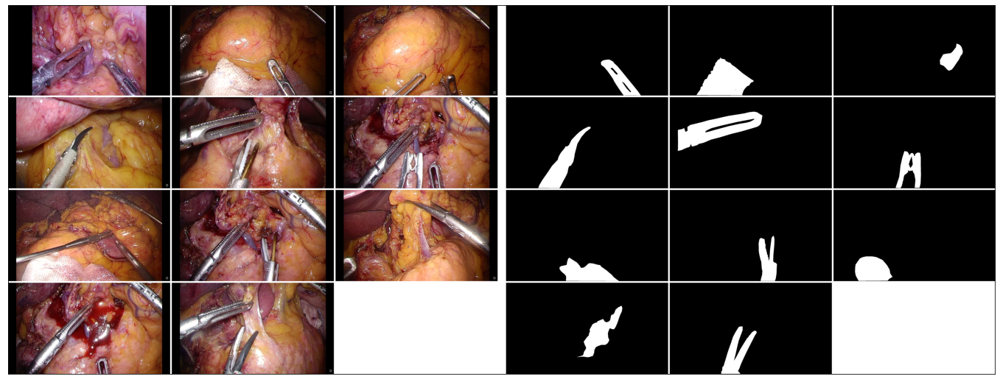

In [17]:
n_rows = 4
n_cols = 3
random_ints = np.arange(len(instruments_data))
ex = 20
h = shape[0]
w = shape[1]
fig_h = (h + ex) * n_rows - ex
fig_w = (w + ex) * n_cols - ex
fig_c = shape[2]

figure_orig = np.ones((fig_h, fig_w, fig_c)).astype(np.uint8) * 255
figure2_orig = np.zeros((fig_h, fig_w)).astype(np.uint8)
figure = np.ones((fig_h, fig_w, fig_c)).astype(np.uint8) * 255
figure2 = np.zeros((fig_h, fig_w)).astype(np.uint8)
for i in range(n_rows):
    for j in range(n_cols):
        if i*n_cols+j + 1 > len(instruments_data):
            figure[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = (255, 255, 255)
            figure2[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = 1
            break
        r_int = random_ints[i*n_cols+j]
        img, mask = inst_img(instruments_data, r_int)
        figure[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = img
        figure[(h+ex)*i+h: (h+ex)*i+h+ex, :] = (255, 255, 255)
        figure[:, (w+ex)*j+w: (w+ex)*j+w+ex] = (255, 255, 255)
        figure2[(h+ex)*i: (h+ex)*i+h, (w+ex)*j: (w+ex)*j+w] = mask
        figure2[(h+ex)*i+h: (h+ex)*i+h+ex, :] = 1
        figure2[:, (w+ex)*j+w: (w+ex)*j+w+ex] = 1
        
figure_mask = np.array([figure2, figure2, figure2]).transpose(1, 2, 0) * 255
figure_ex = (np.ones((figure.shape[0], ex*5, 3)) * 255).astype(np.uint8)

figure_total = np.concatenate([figure, figure_ex, figure_mask], axis=1)
plt.figure(figsize=(4 * n_cols * 2, 3 * n_rows))
plt.imshow(figure_total)
plt.xticks([])
plt.yticks([])
# plt.savefig("frame_masks.png")
plt.show()

In [ ]:
# cv2.imwrite("frame_data_augment_orig.png", cv2.resize(cv2.cvtColor(figure_total, cv2.COLOR_RGB2BGR), (1920 + 960, 1080)))

# Process Instruments Augmentation

In [39]:
def instruments_over_img_step1(instruments_dir, instruments_data, img_orig, mask_orig, transform=A.Compose([])):
    img = img_orig.copy()
    mask = mask_orig.copy()
    n = len(instruments_data)
        
    n_adding = np.random.randint(2)
    n_adding = 1
    i = -1
    for j in range(n_adding):
        suggest_i = np.random.randint(n)
        if suggest_i != i:
            i = np.random.randint(n)
        # elif suggest_i in [1, 5, 10]:
        #     continue
        else:
            continue
#         i = 6
        i = 7
        
        number = instruments_data[i]
        instrument_movie_name = "movieFrame_{}.png".format(number)
        instrument_label_name = "label_{}.png".format(number)
        instrument_movie_path = os.path.join(os.path.join(instruments_dir, "movie"), instrument_movie_name)
        instrument_label_path = os.path.join(os.path.join(instruments_dir, "label"), instrument_label_name)

        img2 = cv2.imread(instrument_movie_path)
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
        mask2 = cv2.imread(instrument_label_path)
        mask2 = np.where(mask2 != 0, 1, 0)
        
        plt.figure(figsize=(14, 14))
        plt.subplots_adjust(wspace=0.05, hspace=0.05)
        plt.subplot(1, 2, 1)
        plt.title("Select")
        plt.imshow(img2)
        plt.xticks([])
        plt.yticks([])
        plt.subplot(1, 2, 2)
        plt.imshow(mask2*255)
        plt.xticks([])
        plt.yticks([])
        plt.show()

        y_inds = np.where(mask2[..., 0] != 0)[0]
        x_inds = np.where(mask2[..., 0] != 0)[1]
        y_min_inds = np.min(y_inds)
        y_max_inds = np.max(y_inds)
        x_min_inds = np.min(x_inds)
        x_max_inds = np.max(x_inds)
        mask3 = mask2[y_min_inds: y_max_inds, x_min_inds: x_max_inds]
        img3 = img2[y_min_inds: y_max_inds, x_min_inds: x_max_inds]
        new_img3 = np.where(mask3 != 0, img3, 0)
        
        plt.figure(figsize=(6, 14))
        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        plt.subplot(1, 2, 1)
        plt.title("Cropping")
        plt.imshow(img3)
        plt.xticks([])
        plt.yticks([])
        plt.subplot(1, 2, 2)
        plt.imshow(mask3*255)
        plt.xticks([])
        plt.yticks([])
        plt.show()

        transformed = transform(image=img3, mask=mask3)
        img3, mask3 = transformed["image"].astype(np.uint8), transformed["mask"].astype(np.uint8)
        
        plt.figure(figsize=(6, 14))
        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        plt.subplot(1, 2, 1)
        plt.title("Transformed")
        plt.imshow(img3)
        plt.xticks([])
        plt.yticks([])
        plt.subplot(1, 2, 2)
        plt.imshow(mask3*255)
        plt.xticks([])
        plt.yticks([])
        plt.show()

        new_img3 = np.where(mask3 != 0, img3, 0)

        h = img.shape[0]
        w = img.shape[1]
        over_img = np.zeros(img.shape).astype(np.uint8)
        over_mask = np.zeros(img.shape).astype(np.uint8)
        
        r = np.random.randint(2)
        r = 0
        offset = 100
        if r == 0:
            img4 = np.rot90(img3)
            mask4 = np.rot90(mask3)
            plt.figure(figsize=(14, 14))
            plt.subplots_adjust(wspace=0.05, hspace=0.05)
            plt.subplot(1, 2, 1)
            plt.title("Rotation")
            plt.imshow(img4)
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 2, 2)
            plt.imshow(mask4*255)
            plt.xticks([])
            plt.yticks([])
            plt.show()
            if img4.shape[0] > h:
                img4 = cv2.resize(img4, (h, img4.shape[1]))
                mask4 = cv2.resize(mask4, (h, mask4.shape[1]))
            elif img4.shape[1] > w:
                img4 = cv2.resize(img4, (img4.shape[0], w))
                mask4 = cv2.resize(mask4, (mask4.shape[0], w))
            h_b = img4.shape[0]
            w_b = img4.shape[1]
            h_i = np.random.randint(h-h_b+1)
            w_i = w-w_b -offset
            over_img[h_i: h_i+h_b, w_i: w_i+w_b] = img4
            over_mask[h_i: h_i+h_b, w_i: w_i+w_b] = mask4
        else:
            plt.figure(figsize=(14, 14))
            plt.subplots_adjust(wspace=0.05, hspace=0.05)
            plt.subplot(1, 2, 1)
            plt.title("Rotation")
            plt.imshow(img3)
            plt.xticks([])
            plt.yticks([])
            plt.subplot(1, 2, 2)
            plt.imshow(mask3*255)
            plt.xticks([])
            plt.yticks([])
            plt.show()
            if img3.shape[0] > h:
                img3 = cv2.resize(img3, (h, img3.shape[1]))
                mask3 = cv2.resize(mask3, (h, mask3.shape[1]))
            elif img3.shape[1] > w:
                img3 = cv2.resize(img3, (img3.shape[0], w))
                mask3 = cv2.resize(mask3, (mask3.shape[0], w))
            h_b = img3.shape[0]
            w_b = img3.shape[1]
            h_i = h-h_b
            w_i = np.random.randint(offset, w-w_b -offset)
            over_img[h_i: h_i+h_b, w_i: w_i+w_b] = img3
            over_mask[h_i: h_i+h_b, w_i: w_i+w_b] = mask3

        img[np.where(over_mask != 0)] = over_img[np.where(over_mask != 0)]
        mask[np.where(over_mask[..., 0] != 0)] = 0
        
        plt.figure(figsize=(14, 14))
        plt.subplots_adjust(wspace=0.05, hspace=0.05)
        plt.subplot(1, 2, 1)
        plt.title("Original")
        plt.imshow(img_orig)
        plt.xticks([])
        plt.yticks([])
        plt.subplot(1, 2, 2)
        plt.imshow(mask_orig, cmap="gray")
        plt.xticks([])
        plt.yticks([])
        plt.show()

        plt.figure(figsize=(14, 14))
        plt.subplots_adjust(wspace=0.05, hspace=0.05)
        plt.subplot(1, 2, 1)
        plt.title("After")
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
        plt.subplot(1, 2, 2)
        plt.imshow(mask, cmap="gray")
        plt.xticks([])
        plt.yticks([])
        plt.show()
    return img, mask

In [62]:
img_orig, mask_orig, _ = dataset[40]

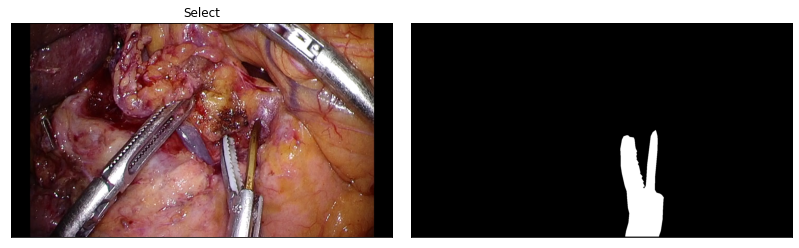

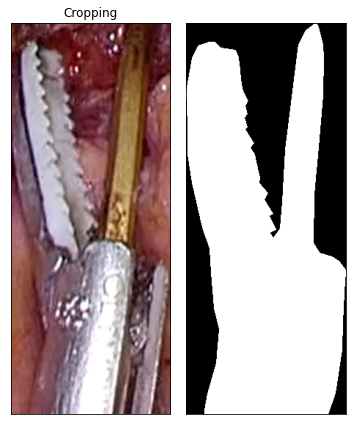

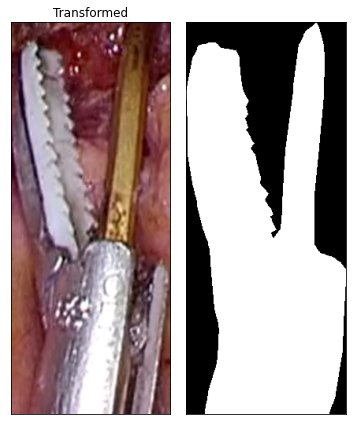

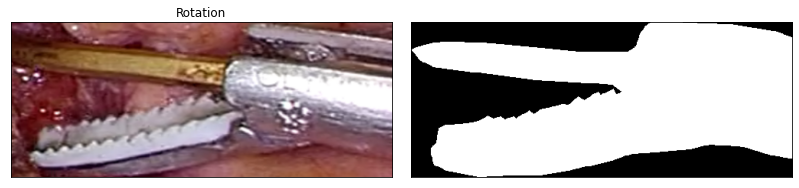

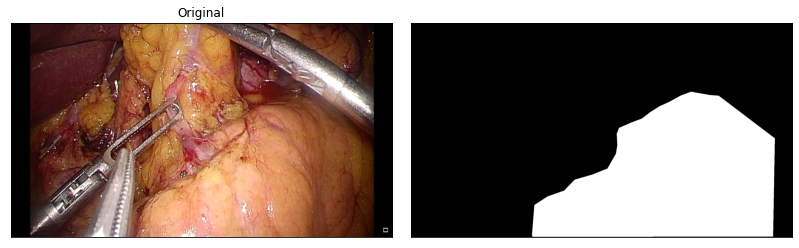

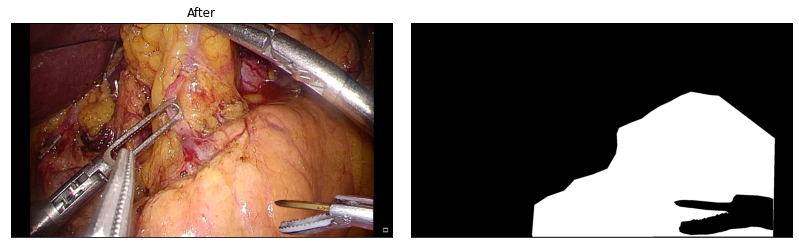

(array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
     

In [63]:
instruments_over_img_step1(instruments_dir, instruments_data, img_orig, mask_orig, transform=instruments_transform1)